In [1]:
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import datetime
import statsmodels.tsa as tsa
import statsmodels.api as sm
import statsmodels.graphics.tsaplots as tsaplots
import statsmodels.tsa.stattools as stattools
from scipy import stats
import seaborn as sns
import matplotlib

Lectura del Dataset

In [2]:
df = pd.read_csv('Dataset/AEP_hourly.csv', sep=',')

In [3]:
df

,Datetime,AEP_MW
0,2004-12-31 01:00:00,13478.0
1,2004-12-31 02:00:00,12865.0
2,2004-12-31 03:00:00,12577.0
3,2004-12-31 04:00:00,12517.0
4,2004-12-31 05:00:00,12670.0
...,...,...
121268,2018-01-01 20:00:00,21089.0
121269,2018-01-01 21:00:00,20999.0
121270,2018-01-01 22:00:00,20820.0
121271,2018-01-01 23:00:00,20415.0


Text(0.5, 1.0, 'Consumo de electricidad de la proveedora de energia American Electric Power Company, Inc ')

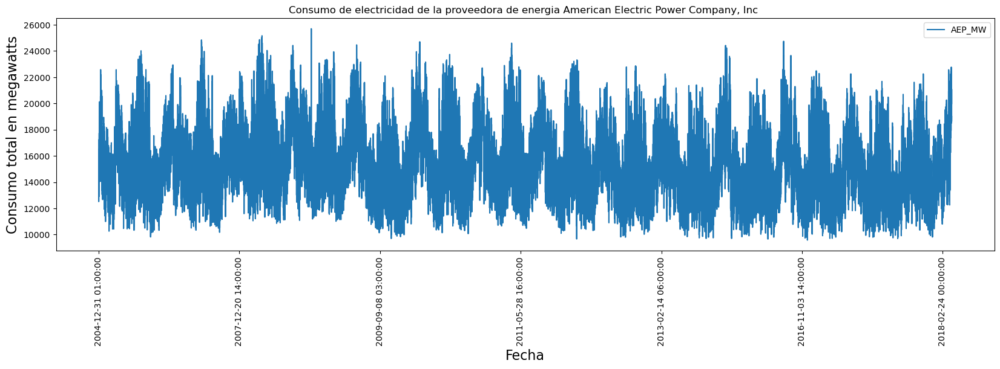

In [4]:
plt.rcParams["figure.figsize"] = (20,5)
ax = df.plot(x="Datetime",y='AEP_MW',rot=90)
ax.set_ylabel("Consumo total en megawatts", fontsize=16)
ax.set_xlabel("Fecha", fontsize=16)
ax.set_title("Consumo de electricidad de la proveedora de energia American Electric Power Company, Inc ")

In [5]:
df["Datetime2"] = pd.to_datetime(df["Datetime"])

In [6]:
df = df[df["Datetime2"]>=datetime.datetime(2005, 1, 1)]
df = df[df["Datetime2"]<=datetime.datetime(2018, 12, 31)]

Text(0.5, 1.0, 'Consumo de electricidad de la proveedora de energia American Electric Power Company, Inc ')

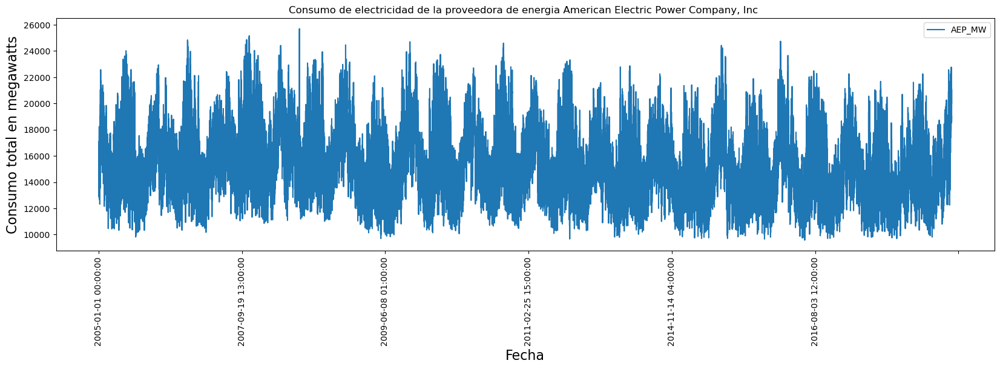

In [7]:
plt.rcParams["figure.figsize"] = (20,5)
ax = df.plot(x="Datetime",y='AEP_MW',rot=90)
ax.set_ylabel("Consumo total en megawatts", fontsize=16)
ax.set_xlabel("Fecha", fontsize=16)
ax.set_title("Consumo de electricidad de la proveedora de energia American Electric Power Company, Inc ")

In [8]:
df["Date"]=df["Datetime2"].dt.date

In [9]:
#Elimino dias de años bisiestos
df = df[df.Date != datetime.date(2008,2,29)]
df = df[df.Date != datetime.date(2012,2,29)]
df = df[df.Date != datetime.date(2016,2,29)]
df = df[df.Date != datetime.date(2020,2,29)]

In [10]:
df2 = df.groupby(["Date"]).agg({'AEP_MW': [np.max]})

In [11]:
df2["Date2"] = df2.index
df2 = df2.set_index(pd.Series(range(1,len(df2)+1)))
df2["Date"] = df2["Date2"]
df2 = df2.drop(columns=["Date2"])

In [12]:
df2

,AEP_MW,Date
,amax,
1,14536.0,2005-01-01
2,15269.0,2005-01-02
3,17097.0,2005-01-03
4,17434.0,2005-01-04
5,18061.0,2005-01-05
...,...,...
4956,18262.0,2018-07-30
4957,16984.0,2018-07-31
4958,17204.0,2018-08-01


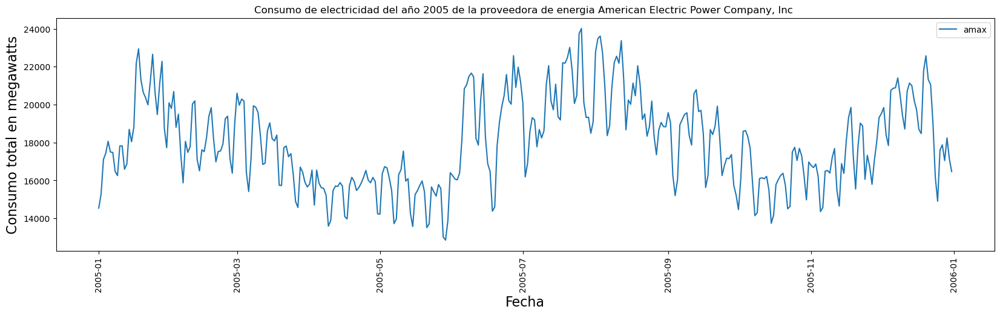

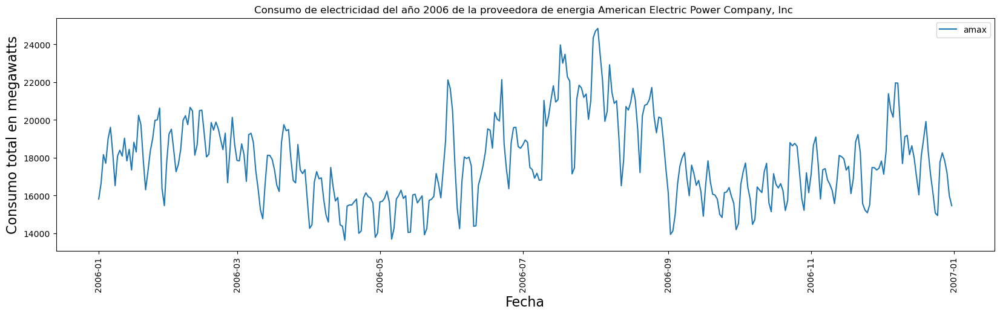

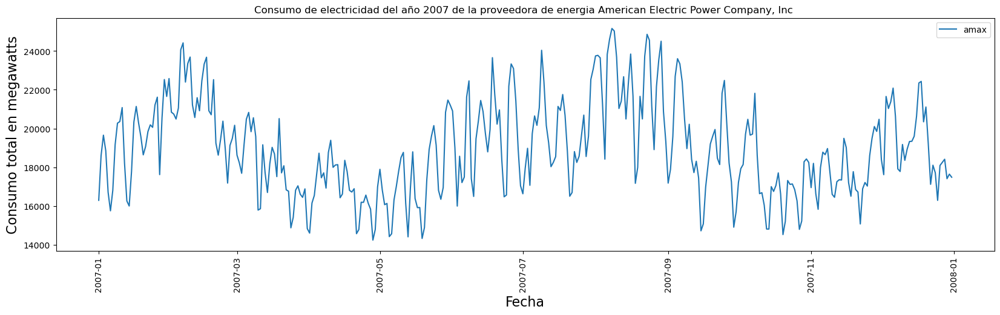

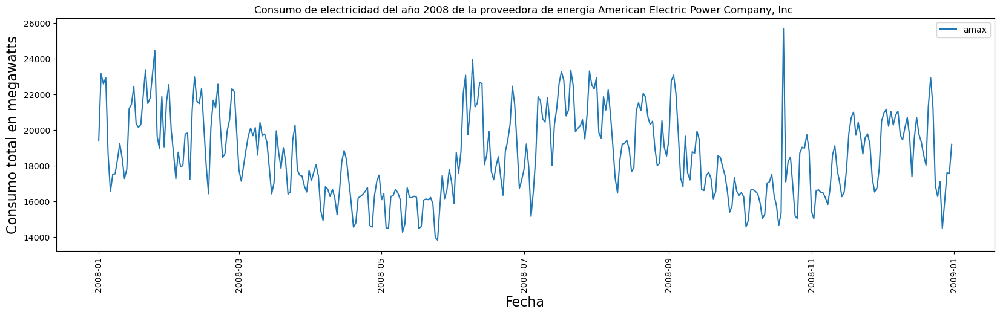

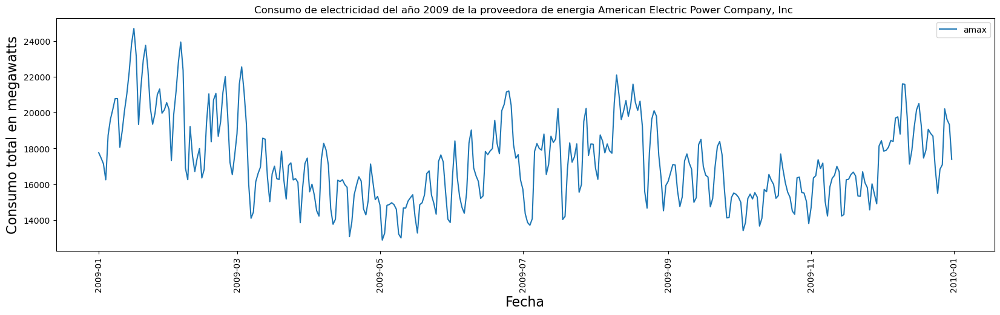

...

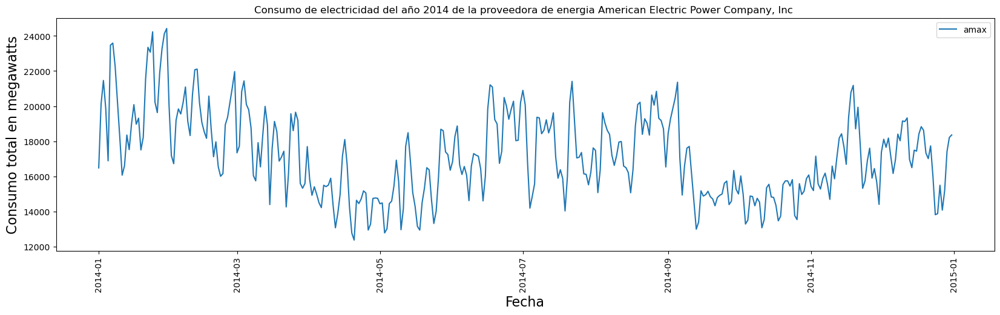

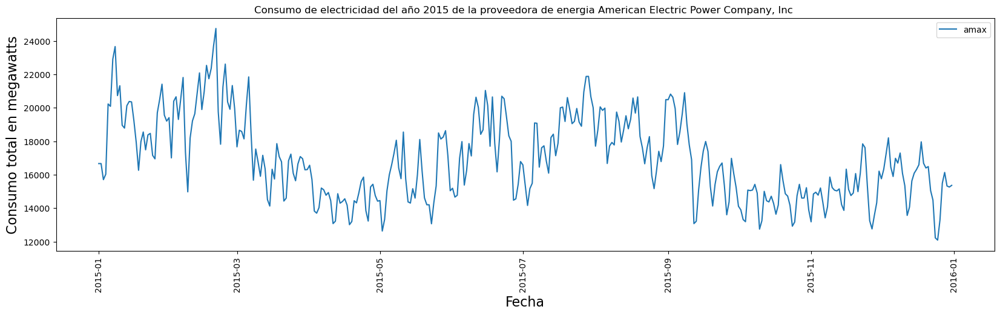

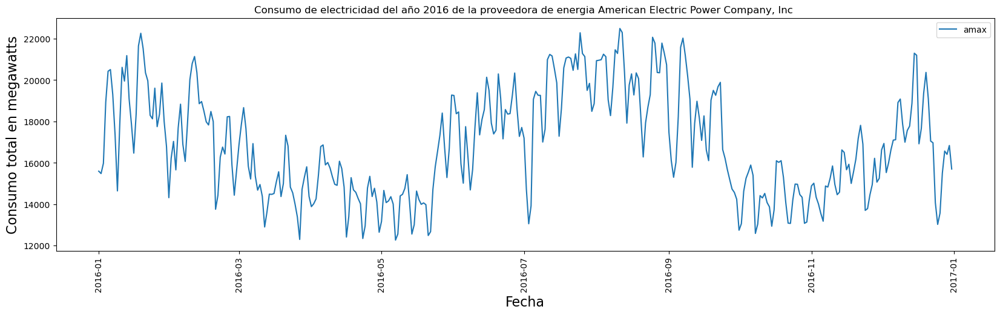

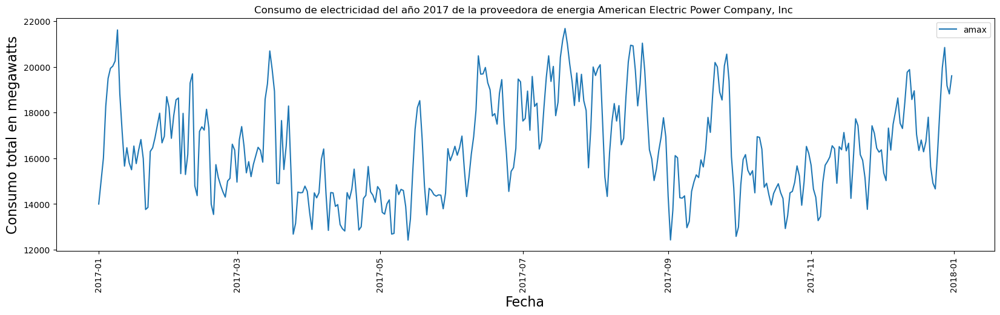

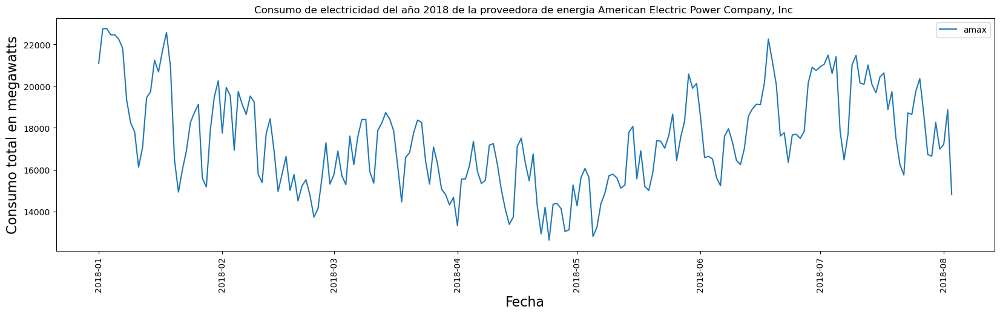

In [13]:
for i in range(14):
    dfx = df2[df2["Date"]>=datetime.date(2005+i, 1, 1)]
    dfx = dfx[dfx["Date"]<=datetime.date(2005+i, 12, 31)]
    ax = dfx.plot(x="Date",y='AEP_MW',rot=90)
    ax.set_ylabel("Consumo total en megawatts", fontsize=16)
    ax.set_xlabel("Fecha", fontsize=16)
    ax.set_title("Consumo de electricidad del año "+str(2005+i)+" de la proveedora de energia American Electric Power Company, Inc ")
    

In [14]:
years = [str(x) for x in list(range(2005,2018))]

In [15]:
import random
def randomColor():
    return ["#"+''.join([random.choice('ABCDEF0123456789') for i in range(6)])]

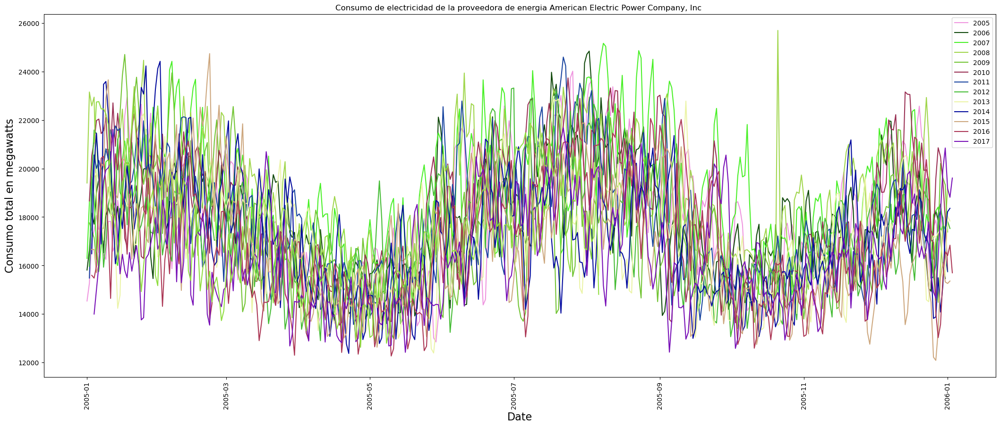

In [16]:
fig, ax = plt.subplots(1,1,figsize=(26,10))
ax.set_ylabel("Consumo total en megawatts", fontsize=16)
ax.set_xlabel("Fecha", fontsize=16)
ax.set_title("Consumo de electricidad de la proveedora de energia American Electric Power Company, Inc ")
for i in range(14):
    color=randomColor()
    dfx = df2[df2["Date"]>=datetime.date(2005+i, 1, 1)]
    dfx = dfx[dfx["Date"]<=datetime.date(2005+i, 12, 31)]
    dfx["Date"] = dfx["Date"] - datetime.timedelta(days=i*365)
    ax = dfx.plot(x="Date",y='AEP_MW',rot=90,color=color,ax=ax)
    ax.legend(years);
    
    

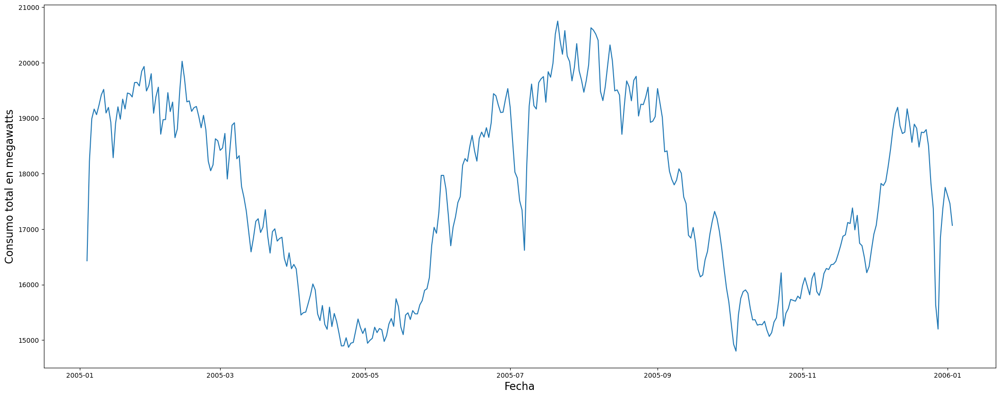

In [17]:
fig, ax = plt.subplots(1,1,figsize=(26,10))
ax.set_ylabel("Consumo total en megawatts", fontsize=16)
ax.set_xlabel("Fecha", fontsize=16)
listOfValues=np.array([])
for i in range(13):
    color=randomColor()
    dfx = df2[df2["Date"]>=datetime.date(2005+i, 1, 1)]
    dfx = dfx[dfx["Date"]<=datetime.date(2005+i, 12, 31)]
    dfx["Date"] = dfx["Date"] - datetime.timedelta(days=i*365)
    if(listOfValues.size==0):
        listOfValues=np.array(dfx["AEP_MW"]["amax"])
    else:
        listOfValues+=np.array(dfx["AEP_MW"]["amax"])
    
    #ax = dfx.plot(x="Date",y='AEP_MW',rot=90,color=color,ax=ax)
    #ax.legend(years);
    

plt.plot(dfx["Date"],listOfValues/13)




plt.show()

Viendo esta serie de tiempo podemos ver una estacionalidad a los largo del año, si bien tiene cambios, en general el consumo sube bastante durante tanto los meses mas calurosos del verano y los meses mas frios del invierno.

# Descompocision usando modelo aditivo

## Additive

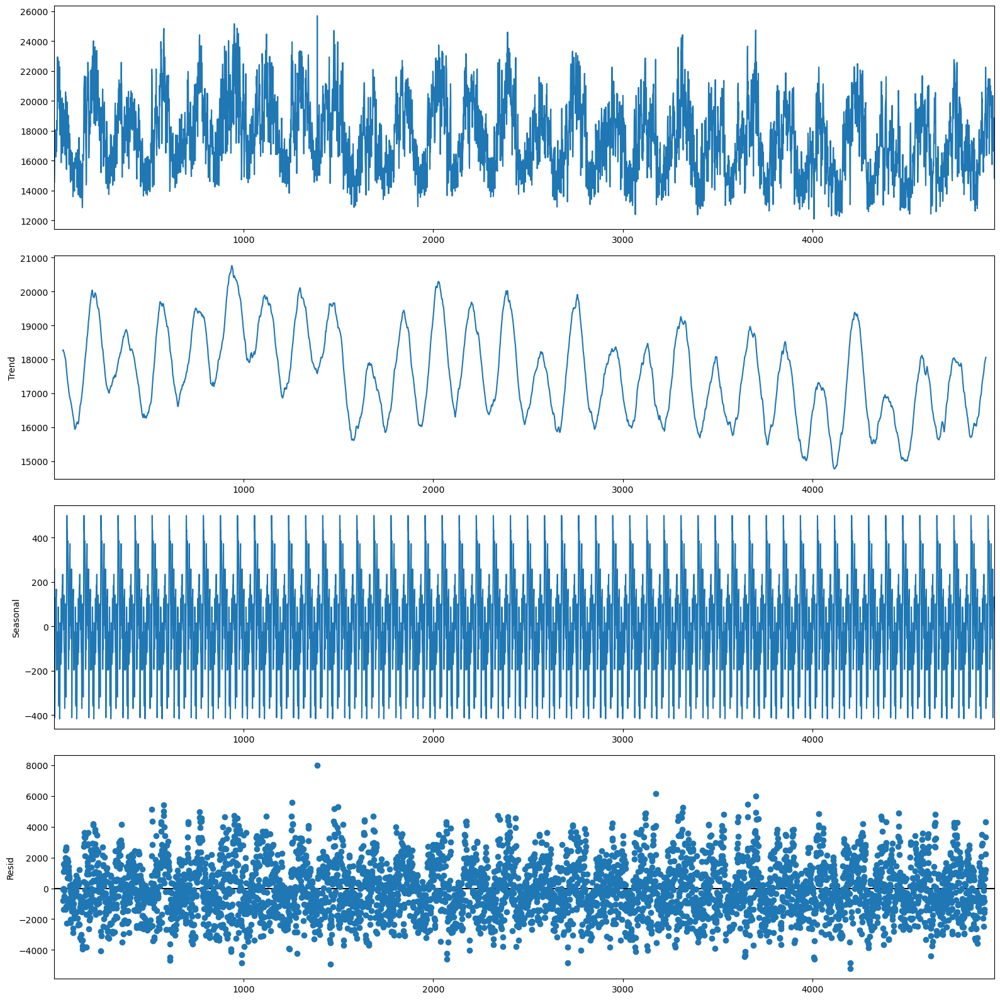

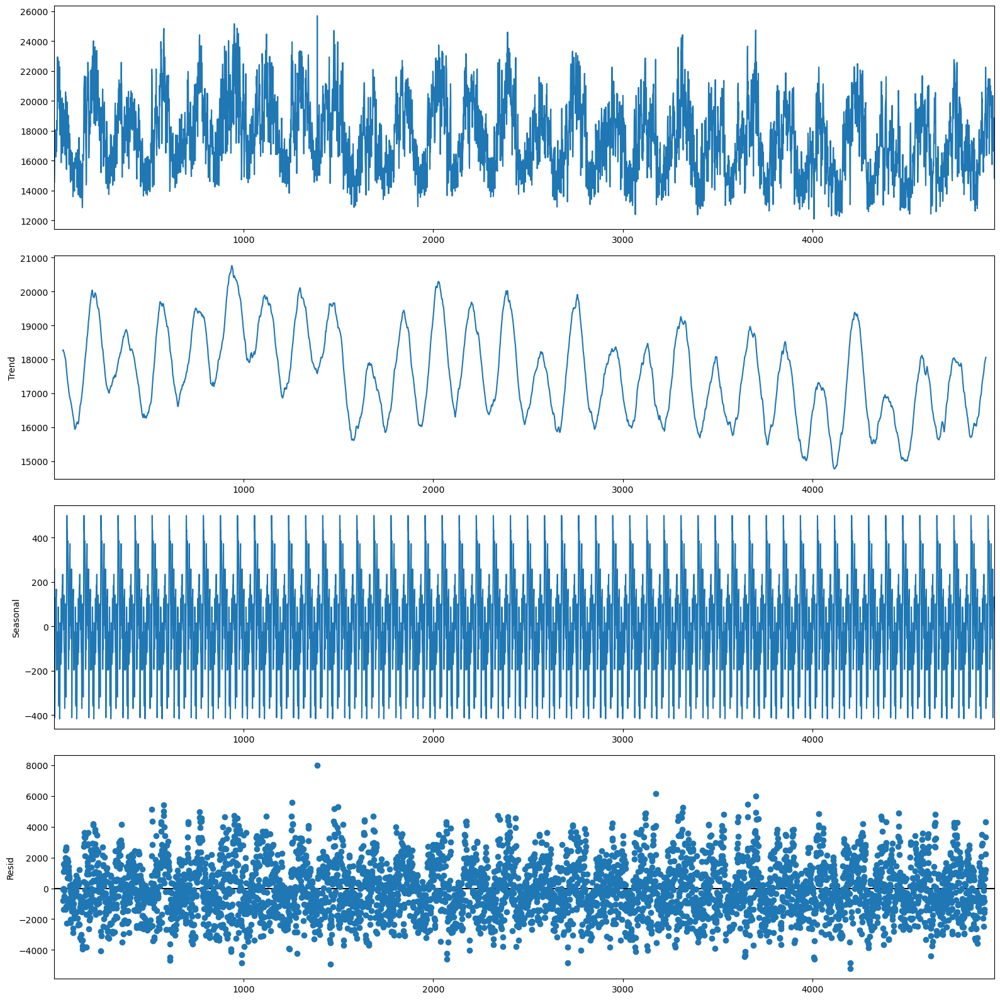

In [18]:
matplotlib.rcParams['figure.figsize'] = [16,16]
period=90
addit=sm.tsa.seasonal_decompose(df2["AEP_MW"], model='additive', period=period)
addit.plot()

## Multiplicative

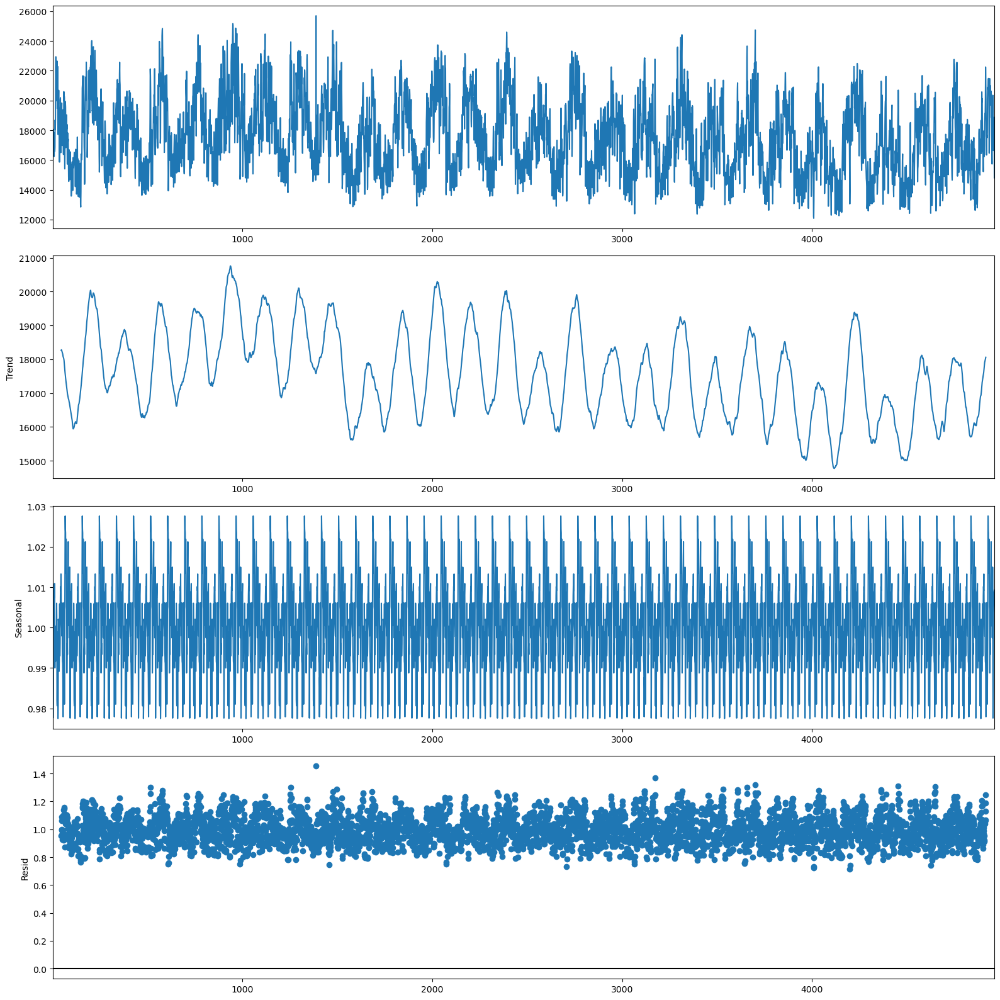

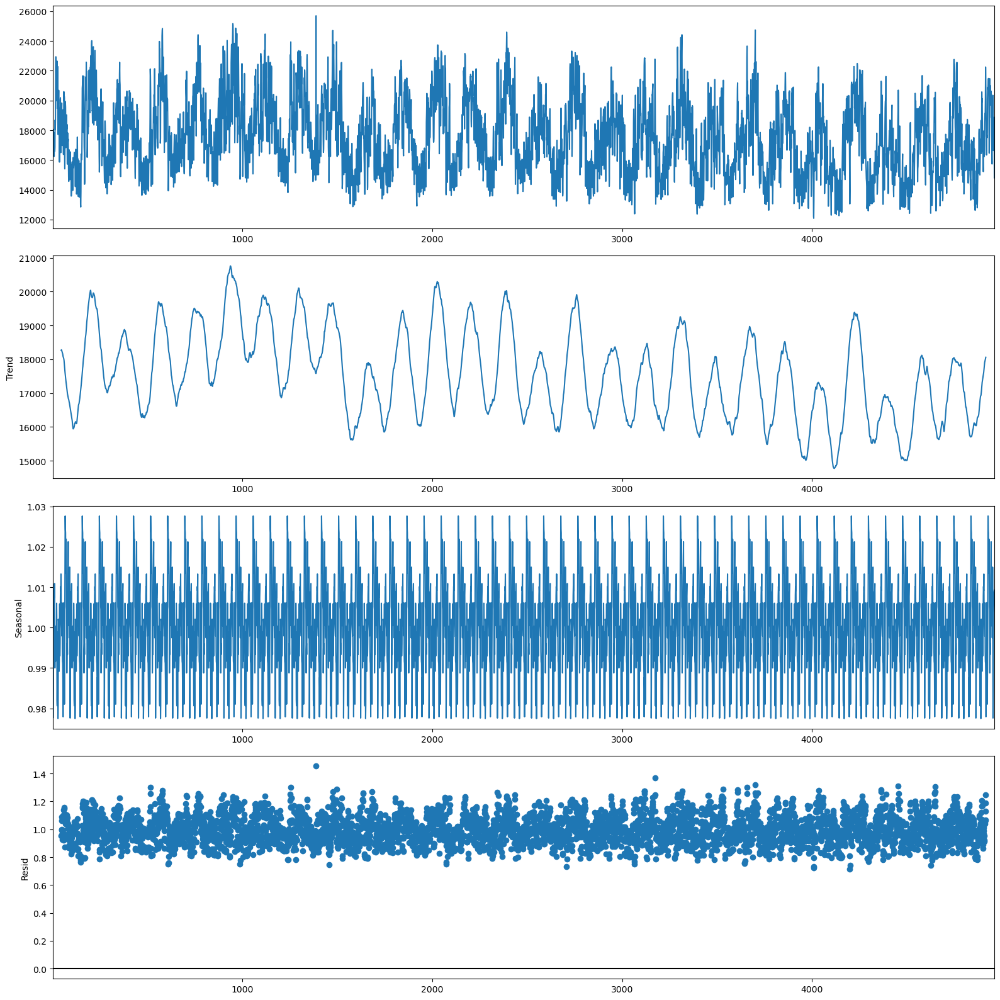

In [19]:
matplotlib.rcParams['figure.figsize'] = [16,16]
mult = sm.tsa.seasonal_decompose(df2["AEP_MW"] , model='multiplicative', period=period)
mult.plot()

# Extraer Tendendcia

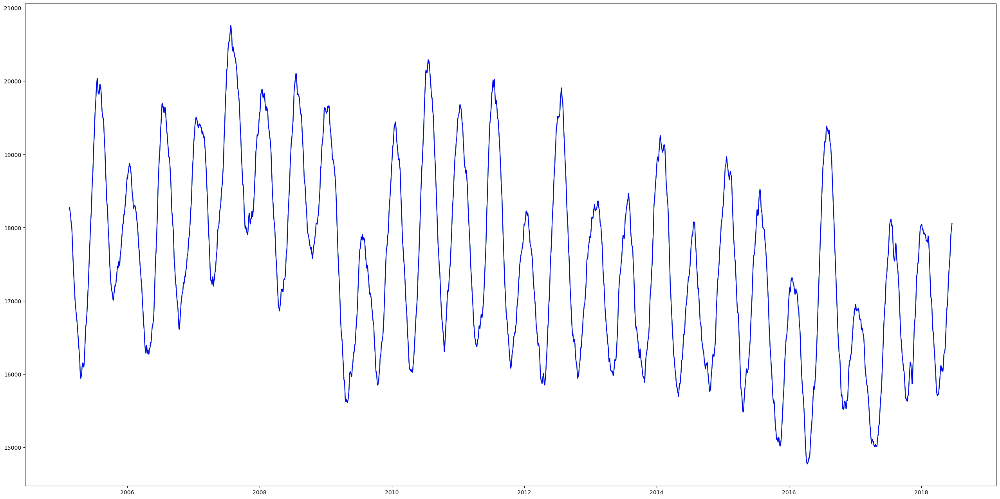

In [20]:
matplotlib.rcParams['figure.figsize'] = [32,16]
period=90
dfx = df2[df2["Date"]>=datetime.date(2006, 1, 1)]
dfx = dfx[dfx["Date"]<=datetime.date(2006, 12, 31)]
addit = sm.tsa.seasonal_decompose(df2["AEP_MW"], model='additive', period=period)
mult = sm.tsa.seasonal_decompose(df2["AEP_MW"], model='multiplicative', period=period)
plt.plot(df2["Date"],addit.trend, color="green")
plt.plot(df2["Date"],mult.trend, color="blue")
plt.show()

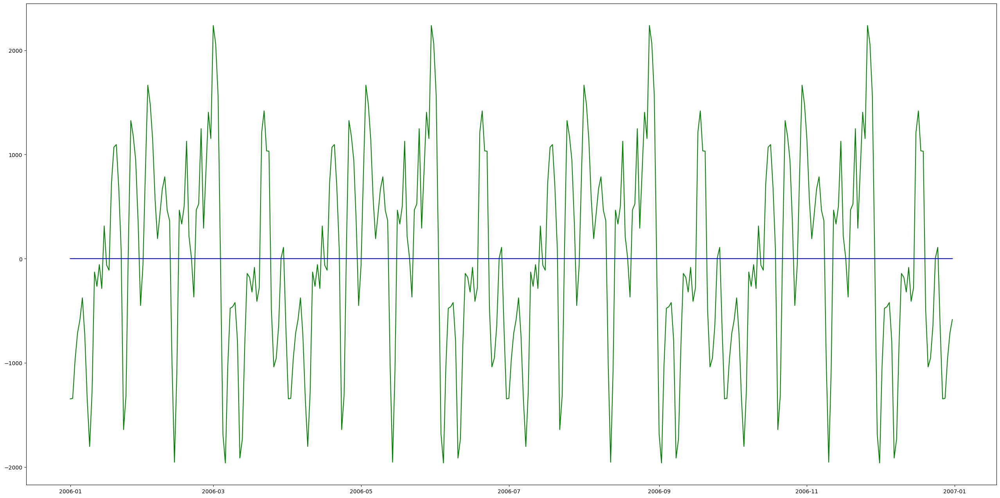

In [21]:
period=90
dfx = df2[df2["Date"]>=datetime.date(2006, 1, 1)]
dfx = dfx[dfx["Date"]<=datetime.date(2006, 12, 31)]
#dfx=df2
addit = sm.tsa.seasonal_decompose(dfx["AEP_MW"], model='additive', period=period)
mult = sm.tsa.seasonal_decompose(dfx["AEP_MW"], model='multiplicative', period=period)
plt.plot(dfx["Date"],addit.seasonal, color="green")
plt.plot(dfx["Date"],mult.seasonal, color="blue")
plt.show()

## Ajustar a un modelo deterministico

In [22]:
z  = np.polyfit(list(range(len(df2["AEP_MW"]))),list(df2["AEP_MW"]["amax"]), 30)

C:\Users\Colo\miniconda3\lib\site-packages\IPython\core\interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


In [23]:
p = np.poly1d(z)

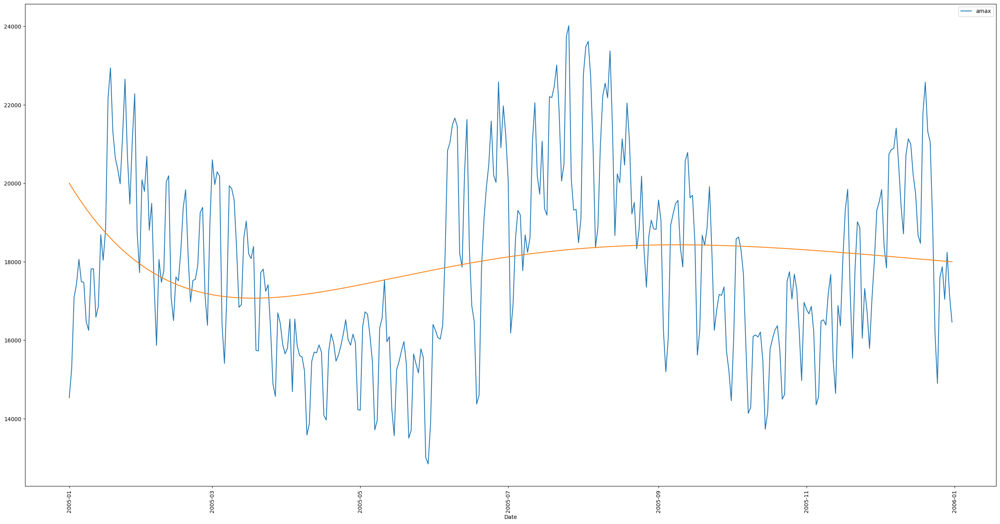

In [24]:
xp = np.linspace(0, 365, 365)


#dfx = df2[df2["Date"]>=datetime.date(2005+i, 1, 1)]
dfx = df2[0:365]
ax = dfx.plot(x="Date",y='AEP_MW',rot=90)
plt.plot(df2["Date"][0:365], p(xp))


plt.show()

In [25]:
arr = np.array(xp)
arr = arr = arr.astype('int')

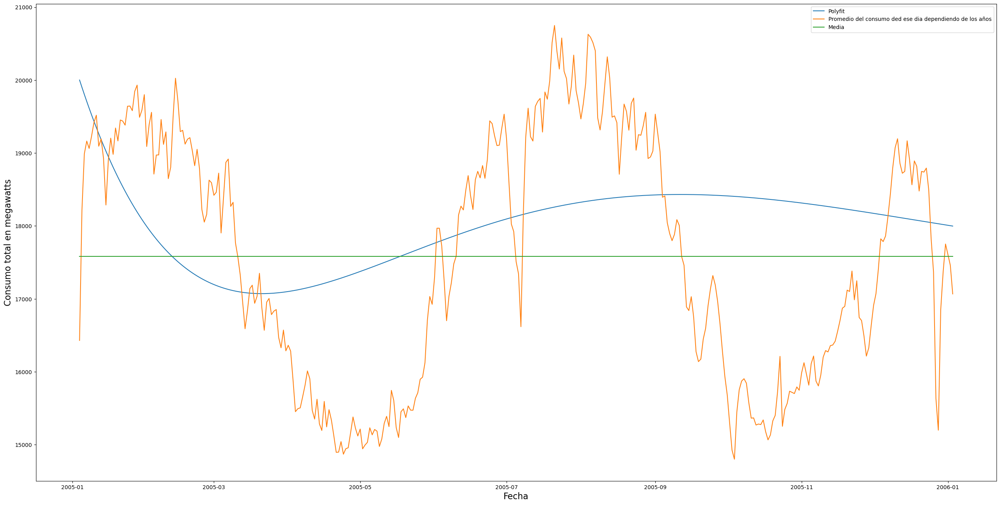

In [26]:
fig, ax = plt.subplots(1,1,figsize=(32,16))
#matplotlib.rcParams['figure.figsize'] = [32,16]
ax.set_ylabel("Consumo total en megawatts", fontsize=16)
ax.set_xlabel("Fecha", fontsize=16)
listOfValues=np.array([])
for i in range(13):
    color=randomColor()
    dfx = df2[df2["Date"]>=datetime.date(2005+i, 1, 1)]
    dfx = dfx[dfx["Date"]<=datetime.date(2005+i, 12, 31)]
    dfx["Date"] = dfx["Date"] - datetime.timedelta(days=i*365)
    if(listOfValues.size==0):
        listOfValues=np.array(dfx["AEP_MW"]["amax"])
    else:
        listOfValues+=np.array(dfx["AEP_MW"]["amax"])
    
    #ax = dfx.plot(x="Date",y='AEP_MW',rot=90,color=color,ax=ax)
    #ax.legend(years);
    

plt.plot(dfx["Date"], p(xp))
plt.plot(dfx["Date"], listOfValues/13)
plt.plot(dfx["Date"], np.ones(365)*np.sum(listOfValues/13)/365)
ax.legend(["Polyfit","Promedio del consumo ded ese dia dependiendo de los años","Media"]);


plt.show()

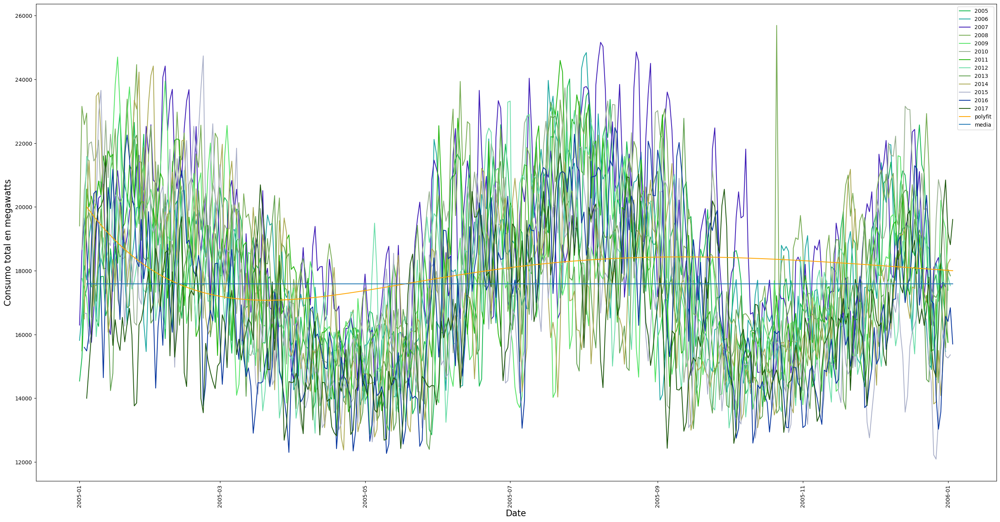

In [27]:
fig, ax = plt.subplots(1,1,figsize=(32,16))
#matplotlib.rcParams['figure.figsize'] = [32,16]
ax.set_ylabel("Consumo total en megawatts", fontsize=16)
ax.set_xlabel("Fecha", fontsize=16)
listOfValues=np.array([])
years.append("polyfit")
years.append("media")

for i in range(13):
    color=randomColor()
    dfx = df2[df2["Date"]>=datetime.date(2005+i, 1, 1)]
    dfx = dfx[dfx["Date"]<=datetime.date(2005+i, 12, 31)]
    dfx["Date"] = dfx["Date"] - datetime.timedelta(days=i*365)
    if(listOfValues.size==0):
        listOfValues=np.array(dfx["AEP_MW"]["amax"])
    else:
        listOfValues+=np.array(dfx["AEP_MW"]["amax"])
    
    ax = dfx.plot(x="Date",y='AEP_MW',rot=90,color=color,ax=ax)
    

plt.plot(dfx["Date"], p(xp), color="orange")
plt.plot(dfx["Date"], np.ones(365)*np.sum(listOfValues/13)/365)
ax.legend(years);
#plt.plot(dfx["Date"], listOfValues/13)
#plt.plot(dfx["Date"], np.ones(365)*np.sum(listOfValues/13)/365)
#ax.legend(["Polyfit","Promedio del consumo ded ese dia dependiendo de los años","Media"]);


plt.show()

Usando polyfit como ajuste, podemos ver que el resultado no es el mejor, mantiene un resultado similar a la media tratando de seguir las tendencias

# Clase 4

## Tests de autocorrelacion

In [28]:
stattools.adfuller(df2["AEP_MW"])

(-7.731802721663457,
 1.1202560657678205e-11,
 29,
 4930,
 {'1%': -3.43167712132583,
  '5%': -2.862126442286194,
  '10%': -2.5670821642549444},
 82998.99968660779)

Basado en el nivel de significancia de 0.05 y el p valor del test de dickey-fuller de 9.7e-12, podemos rechazar la hipotesis nula. Por lo tanto segun este test, la serie es estacionaria.

In [29]:
stattools.kpss(df2["AEP_MW"])

C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


(1.3904345518598662,
 0.01,
 39,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

Basado en el nivel de significancia de 0.05 y el p valor del test KPSS de 0.01,podemos rechazar la hipotesis nula. Por lo tanto segun este test, la serie NO es estacionaria.

De acuerdo a la docunmentacion de statsmodels, en este caso, la serie es difference stationary y por lo tanto, debemos aplicar diferenciacion para poder hacerla estacionaria.

In [102]:
#Aplicacmos differenciacion(el default esta en 1)
df_diff = tsa.statespace.tools.diff(df2["AEP_MW"],5)
df_diff["Date"] = df2["Date"]

In [103]:
stattools.adfuller(df_diff["amax"])

(-37.93568482250735,
 0.0,
 32,
 4922,
 {'1%': -3.4316792794963624,
  '5%': -2.862127395748108,
  '10%': -2.5670826718210007},
 85489.84359340927)

Basado en el nivel de significancia de 0.05 y el p valor del test de dickey-fuller de 3.8e-18, podemos rechazar la hipotesis nula. Por lo tanto segun este test, la serie es estacionaria.

In [104]:
stattools.kpss(df_diff["amax"])

C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


(0.010546317903279694,
 0.1,
 81,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

Basado en el nivel de significancia de 0.05 y el p valor del test KPSS de 0.1,no podemos rechazar la hipotesis nula. Por lo tanto segun este test, la serie es estacionaria.

## Preprocesamiento

Text(0.5, 1.0, 'Probplot despues de aplicar diferenciacion')

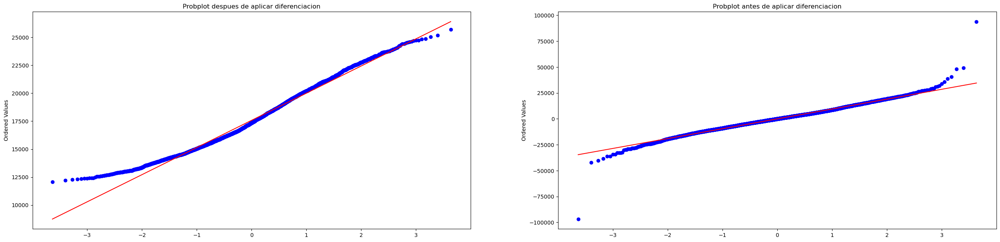

In [105]:
fig = plt.figure()
ax1 = fig.add_subplot(222)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(list(df_diff["amax"]), dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot antes de aplicar diferenciacion')
ax2 = fig.add_subplot(221)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(df2["AEP_MW"]["amax"], dist=stats.norm, plot=ax2)
ax2.set_xlabel('')
ax2.set_title('Probplot despues de aplicar diferenciacion')

## Graficar autocorrelacion

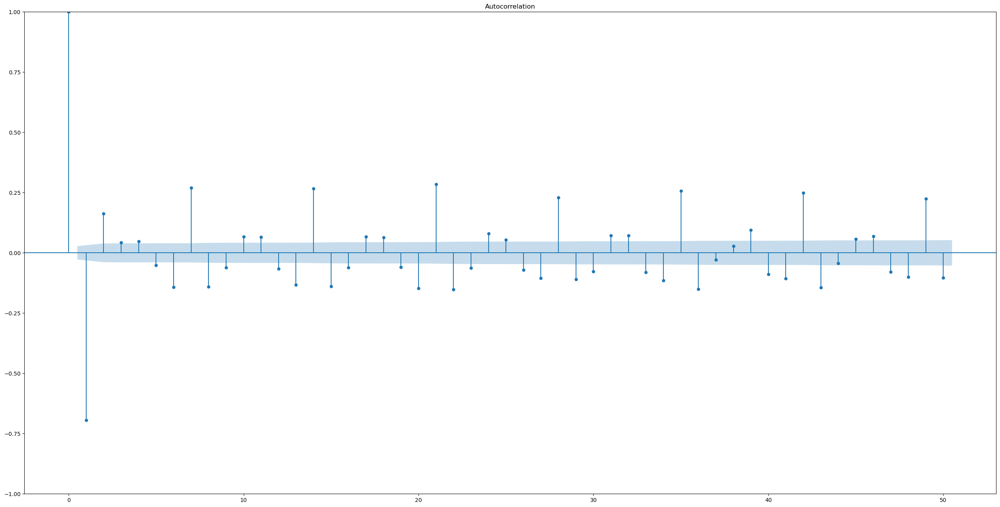

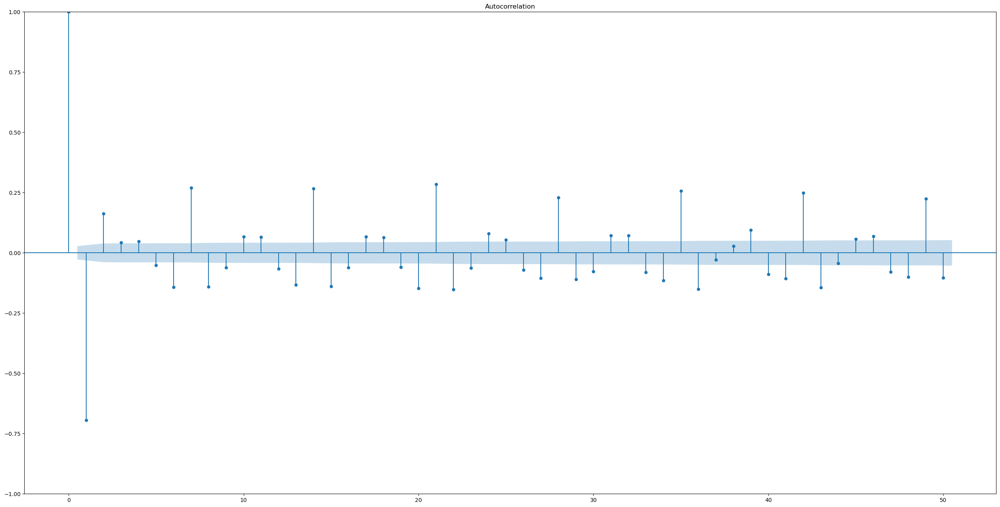

In [145]:
tsaplots.plot_acf(df_diff["amax"], lags=50)

C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


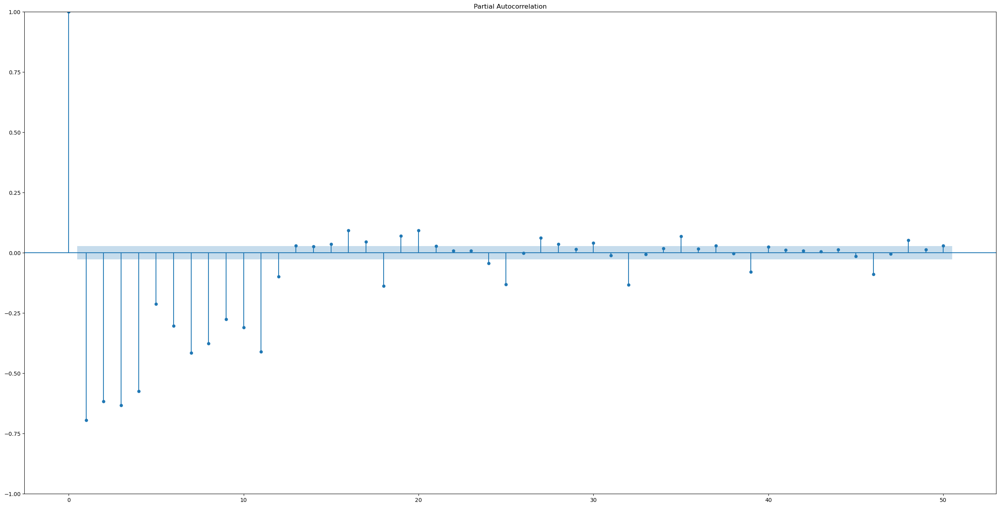

In [146]:
tsaplots.plot_pacf(df_diff["amax"], lags=50);

Usando este grafico de autocorrelacion y autocorrelacion parcial podemos notar que la serie de tiempo no es random y hay correlacion en el mismo.

In [109]:
df = pd.read_csv('Dataset/netflix.csv', sep=',')

In [112]:
df.index=df.Date

In [115]:
df["Close"]

Date
2002-05-23      1.196429
2002-05-24      1.210000
2002-05-28      1.157143
2002-05-29      1.103571
2002-05-30      1.071429
                 ...    
2021-10-05    634.809998
2021-10-06    639.099976
2021-10-07    631.849976
2021-10-08    632.659973
2021-10-11    627.039978
Name: Close, Length: 4881, dtype: float64

In [118]:
stattools.adfuller(df["Close"])

(2.948081364171908,
 1.0,
 30,
 4850,
 {'1%': -3.4316990235892413,
  '5%': -2.8621361184931735,
  '10%': -2.5670873152938674},
 28460.730350878195)

In [119]:
stattools.kpss(df["Close"])

C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


(8.023649823699262,
 0.01,
 42,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

In [140]:
df_close = tsa.statespace.tools.diff(df["Close"],5)

Date
2002-05-31      0.037136
2002-06-03      0.000721
2002-06-04     -0.114286
2002-06-05      0.332852
2002-06-06     -0.349997
                 ...    
2021-10-05     57.610107
2021-10-06   -180.310364
2021-10-07    206.360413
2021-10-08    -80.090271
2021-10-11    -38.059875
Name: Close, Length: 4876, dtype: float64

In [141]:
stattools.adfuller(df_close)

(-38.255958220997634,
 0.0,
 32,
 4843,
 {'1%': -3.4317009744827818,
  '5%': -2.8621369803755154,
  '10%': -2.567087774109517},
 30478.748475278288)

In [142]:
stattools.kpss(df_close)

C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


(0.0192931068259174,
 0.1,
 113,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

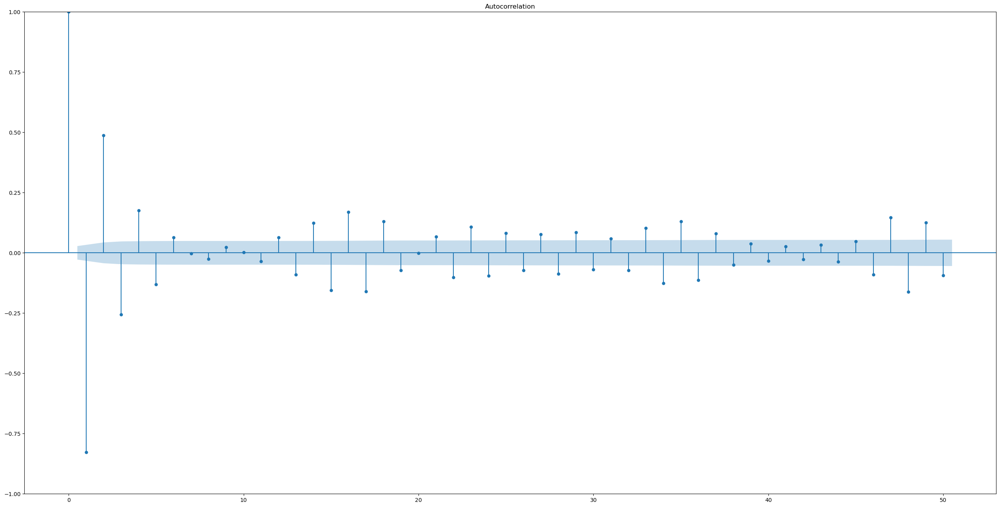

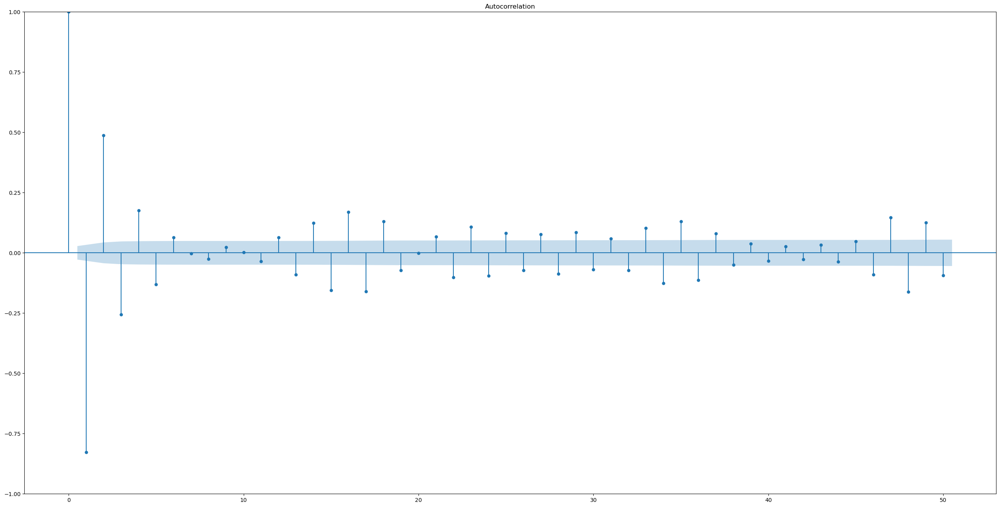

In [135]:
tsaplots.plot_acf(df_close, lags=50)

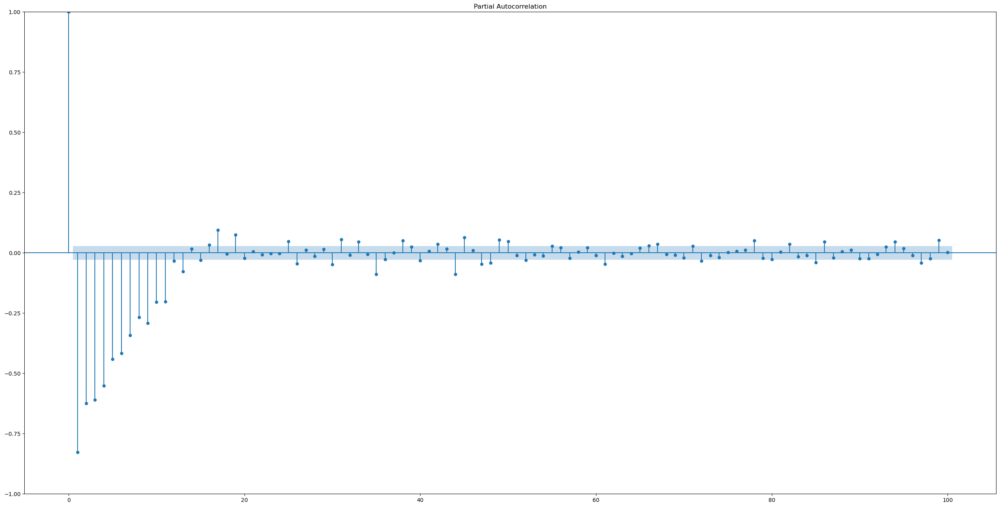

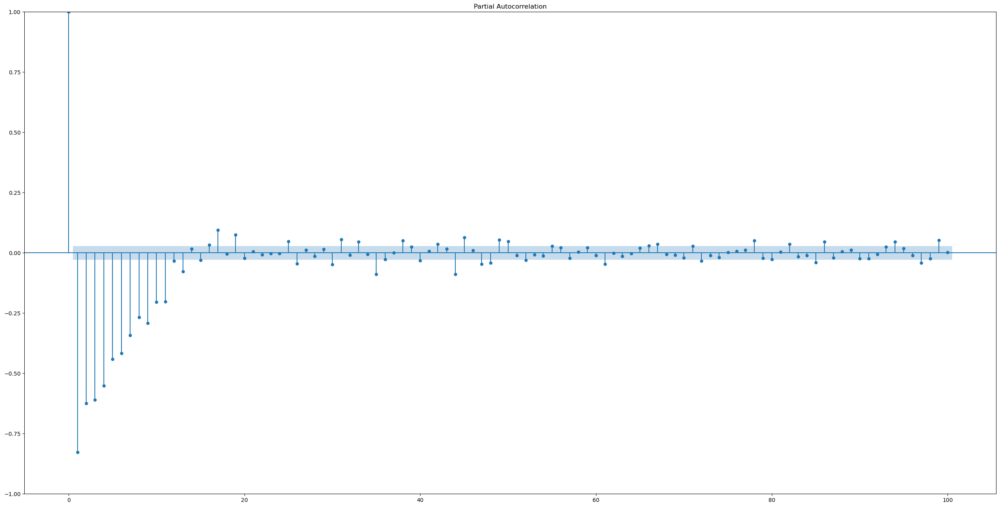

In [132]:
tsaplots.plot_pacf(df_close, lags=100)

In [143]:
model = sm.tsa.statespace.SARIMAX(df_close, order=(1,0,4), seasonal_order=(0,1,0,5))
fitted_model = model.fit(disp=False)
fitted_model.summary()

C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              Close   No. Observations:                 4876
Model:             SARIMAX(1, 0, 4)x(0, 1, [], 5)   Log Likelihood              -16584.489
Date:                            Thu, 06 Apr 2023   AIC                          33180.978
Time:                                    19:03:17   BIC                          33219.924
Sample:                                         0   HQIC                         33194.646
                                           - 4876                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0083      0.006     -1.334      0.182      -0.020       0.004
ma.L1         -3.9830      0.000  -1.85e+04      0.000      -3.983      -3.983
ma.L2          5.9584      0.001   8691.896      0.000       5.957       5.960
ma.L3         -3.9677      0.001  -4771.731      0.000      -3.969      -3.966
ma.L4          0.9923      0.000   2849.741      0.000       0.992       0.993
sigma2        51.3648      0.250    205.607      0.000      50.875      51.854
===================================================================================
Ljung-Box (L1) (Q):                   0.57   Jarque-Bera (JB):            375274.21
Prob(Q):                              0.45   Prob(JB):                         0.00
Heteroskedasticity (H):            4717.16   Skew:                            -0.58
Prob(H) (two-sided):                  0.00   Kurtosis:                        45.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [144]:
model = sm.tsa.statespace.SARIMAX(df_diff["amax"], order=(1,0,4), seasonal_order=(0,1,0,5))
fitted_model = model.fit(disp=False)
fitted_model.summary()

C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Colo\miniconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                               amax   No. Observations:                 4955
Model:             SARIMAX(1, 0, 4)x(0, 1, [], 5)   Log Likelihood              -49759.987
Date:                            Thu, 06 Apr 2023   AIC                          99531.974
Time:                                    19:04:28   BIC                          99571.017
Sample:                                         0   HQIC                         99545.665
                                           - 4955                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0000      0.005   -184.089      0.000      -1.011      -0.989
ma.L1         -1.9999   6.38e-07  -3.14e+06      0.000      -2.000      -2.000
ma.L2      -6.027e-05      0.000     -0.584      0.559      -0.000       0.000
ma.L3          1.9999    2.7e-05   7.41e+04      0.000       2.000       2.000
ma.L4         -0.9999      0.000  -8732.463      0.000      -1.000      -1.000
sigma2      7.508e+07   4.26e-13   1.76e+20      0.000    7.51e+07    7.51e+07
===================================================================================
Ljung-Box (L1) (Q):                 239.15   Jarque-Bera (JB):               141.74
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.76   Skew:                             0.13
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.79
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.31e+36. Standard errors may be unstable.
"""